# Map projections and making your birthquake map [20 points]

Read Chapter 1.3 of the course web-book on map projections.

## Now let's make your first map! [5 points]

We are going to use ```cartopy``` in conjunction with ```matplotlib``` to make maps. ```cartopy``` can transform points, lines and images into different map projections. ```matplotlib``` provides tools to visualize these projections. We will import them using the standard conventions. **You must press play (or more efficiently shift+enter) on the cell that imports these function libraries for the rest of the code to work.**

In [1]:
#Import all of the modules that we're going to need
import cartopy.crs as ccrs
import matplotlib.pyplot as plt
import pandas as pd

The syntax of using these functions takes some getting used to. Here we will keep it really simple with minimal options. We will make a figure, create an axis object with a defined projection, and then plot coastlines and a stock image that shows elevation.

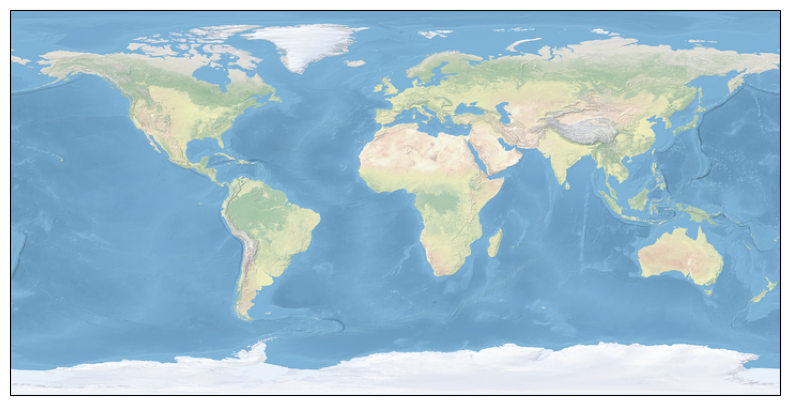

In [2]:
plt.figure(figsize=(10,5))                             # Creates the plot *object* and sets the size
ax = plt.axes(projection=ccrs.PlateCarree())           # Creates the axis *object* with a PlateCarree map projection (more on this later)
ax.stock_img()                                         # Uses the *method* stock_img
plt.show()                                             # Displays the plot object

Let's plot the location of Columbia on a map. Find out the latitude and longitude of Columbia, SC. Then we want to assign the latitude and longitude of Columbia to variables `Columbia_latitude` and `Columbia_longitude`:

<font color=goldenrod>**_Code for you to write_**</font>

In [3]:
Columbia_latitude = 34.0     # *Assigns* the value to the *variable* Columbia_latitude
Columbia_longitude = -81.0       # *Assigns* the value to the *variable* Columbia_longitude

Now we can use the ```plt.scatter``` function to plot the location of Columbia. We give the ```plt.scatter``` function ```Columbia_longitude``` as the x-value, ```Columbia_latitude``` as the y-value while also telling it to transform it into map coordinates (```transform=ccrs.PlateCarree()```) and to make the point red (```color='red'```). We can save the figure using ```plt.savefig()``` putting the name of the file with the extension within the ``()``. In this case, let's call it ```'Mollweide_projection_w_Columbia.png'```

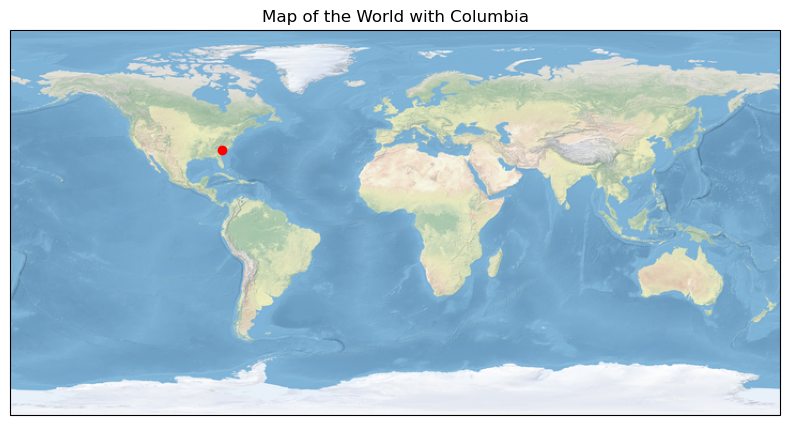

In [4]:
plt.figure(figsize=(15,5))                                # Creates the plot *object* and sets the size
plt.rcParams['figure.dpi'] = 500                          # Sets the plot resolution to 500 Dots Per Inch

ax = plt.axes(projection=ccrs.PlateCarree())              # Creates the axis *object* with a PlateCarree map projection (more on this later)
ax.stock_img()                                            # Uses the *method* stock_img
ax.set_title('Map of the World with Columbia')            # Gives the map a title
plt.scatter([Columbia_longitude], [Columbia_latitude], transform=ccrs.PlateCarree(), color='red') # Uses the *scatter* to plot a symbol at the given lat and lon
plt.savefig('PlateCarree_projection_w_Columbia.png')        #Writes out the figure to a png file

Revisit your notebook from in class when you found your birthquake and enter the latitude of longitude in the cell below assigning them to ```birthquake_latitude``` and ```birthquake_longitude```.

<font color=goldenrod>**_Code for you to write_**</font>

In [5]:
your_birthday  = '1994-06-22'
day_after_your_birthday  = '1994-06-23'
standard_url = 'https://earthquake.usgs.gov/fdsnws/event/1/query?format=csv&orderby=magnitude'

your_birthquake_url = standard_url + '&starttime=' + your_birthday + '&endtime=' + day_after_your_birthday
print(your_birthquake_url)

your_birthday_earthquakes = pd.read_csv(your_birthquake_url)

https://earthquake.usgs.gov/fdsnws/event/1/query?format=csv&orderby=magnitude&starttime=1994-06-22&endtime=1994-06-23


In [6]:
birthquake_latitude = your_birthday_earthquakes.iloc[0]['latitude']         # *Assigns* the value to the *variable* birthquake_latitude
birthquake_longitude = your_birthday_earthquakes.iloc[0]['longitude']         # *Assigns* the value to the *variable* birthquake_longitude

Now you can use the cell below to make a map that plots both Columbia and your birthquake location as well as the shortest line between them. 

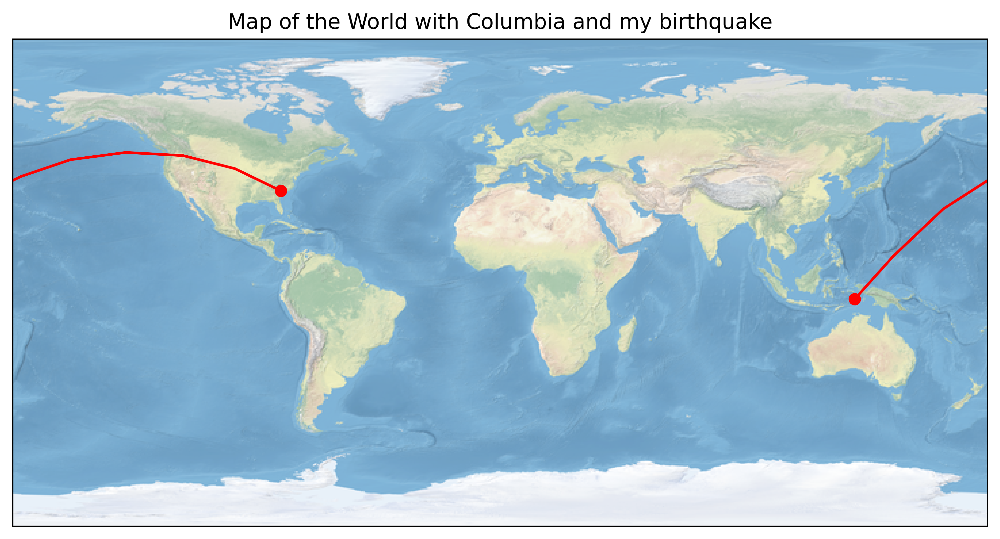

In [7]:
plt.figure(figsize=(10,5))
plt.rcParams['figure.dpi'] = 500                          # Sets the plot resolution to 500 Dots Per Inch
ax = plt.axes(projection=ccrs.PlateCarree())
ax.stock_img()
plt.scatter([Columbia_longitude, birthquake_longitude], [Columbia_latitude, birthquake_latitude], transform=ccrs.PlateCarree(), color='red')
plt.plot([Columbia_longitude, birthquake_longitude], [Columbia_latitude, birthquake_latitude], transform=ccrs.Geodetic(), color='red')
ax.set_title('Map of the World with Columbia and my birthquake')            # Gives the map a title
plt.show()

## Test different map projections [5 points]


We can change the value of the variable `projection` to plot the map in different ways.

## Note there is a Warning, but the map does generate. So you can ignore the warning.

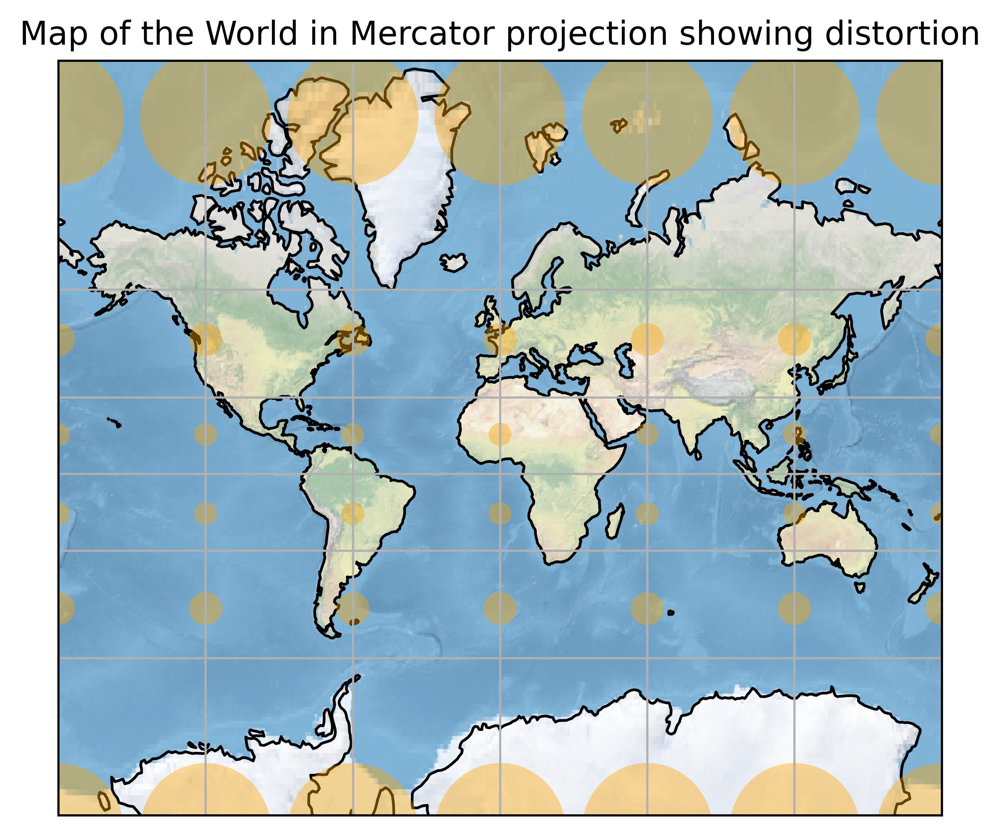

In [8]:
import warnings
warnings.filterwarnings('ignore')

plt.figure(figsize=(10,5))
ax = plt.axes(projection=ccrs.Mercator())

ax.stock_img()
ax.coastlines()
ax.gridlines()

# add equal area circles to see how they are distorted by the projection
ax.tissot(facecolor='orange', alpha=0.4) #alpha set the transparency
ax.set_title('Map of the World in Mercator projection showing distortion')            # Gives the map a title

plt.show()

Change the projection (by **replacing** the '___') and see how it compares. From the list of projections on the [cartopy website](https://scitools.org.uk/cartopy/docs/v0.15/crs/projections.html), select a projection, add it below and plot the map.

**Note** that if you get a long error message (in red shading) that starts like the following:

`---------------------------------------------------------------------------     `

`ValueError                                Traceback (most recent call last)     `

`Cell In[11], line 4                                                             `

`      1 plt.figure(figsize=(10,5))                                              `

`      2 ax = plt.axes(projection=ccrs.Robinson())                               `  

`----> 4 ax.stock_img()                                                          `

`      5 ax.gridlines()                                                          `

`      7 # add equal area circles to see how they are distorted by the projection`

Then you need to change the projection to something else. This will happen with a **Robinson** projection, and some others. The issue is that the background image has issues at the poles for some projections. Just avoid these projections for now. Or use ax.coastlines() instead of ax.stock_img().

<font color=goldenrod>**_Code for you to write_**</font>

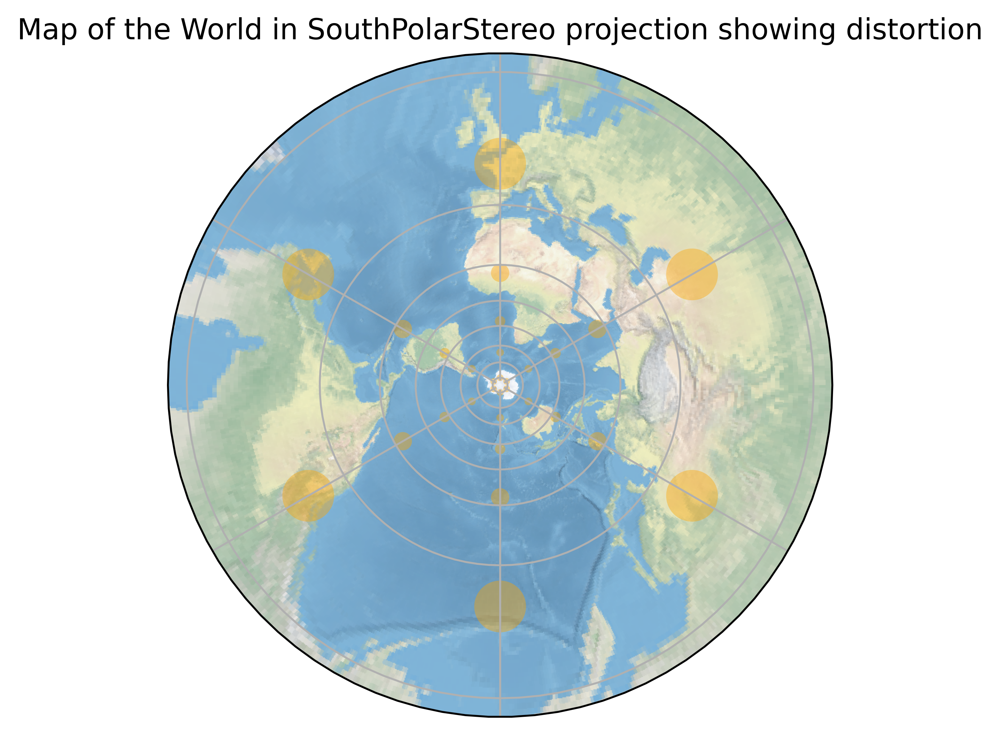

In [9]:
plt.figure(figsize=(10,5))
ax = plt.axes(projection=ccrs.SouthPolarStereo())                                             #<< Choose a map projection

ax.stock_img()
ax.gridlines()

# add equal area circles to see how they are distorted by the projection
ax.tissot(facecolor='orange', alpha=0.4) #alpha set the transparency
ax.set_title('Map of the World in SouthPolarStereo projection showing distortion')            #<< Give the map a title

plt.show()

## Make a map of 5 largest birthdate earthquakes [10 points]

Use the code cells below to make another map where you plot the locations of the 5 largest magnitude earthquakes that occured on the day you were born. Choose any projection you want from the [cartopy website](https://scitools.org.uk/cartopy/docs/v0.15/crs/projections.html).  When you have made this map, save it as a .png file.

<font color=goldenrod>**_Code for you to write_**</font>

In [10]:
#1 Download the data for your birthday
Your_birthday = '1994-06-22'
day_after_Your_birthday = '1994-06-23'
standard_url = 'https://earthquake.usgs.gov/fdsnws/event/1/query?format=csv&orderby=magnitude'
Your_birthquake_url = standard_url + '&starttime=' + Your_birthday + '&endtime=' + day_after_Your_birthday
Your_birthday_earthquakes = pd.read_csv(Your_birthquake_url)               

In [11]:
#2 Save the longitudes and latitudes of the top 5 events to variables called eq_longitudes and eq_latitudes
print (Your_birthday_earthquakes[:5]['latitude'])    # This selects the first 5 rows
print (Your_birthday_earthquakes[:5]['longitude'])   # This selects the first 5 rows

eq_longitudes = Your_birthday_earthquakes[:5]['longitude']                   
eq_latitudes = Your_birthday_earthquakes[:5]['latitude']

0    -6.043
1   -10.565
2   -10.329
3     5.281
4    -6.445
Name: latitude, dtype: float64
0    130.905
1    112.644
2    116.775
3    127.002
4    152.935
Name: longitude, dtype: float64


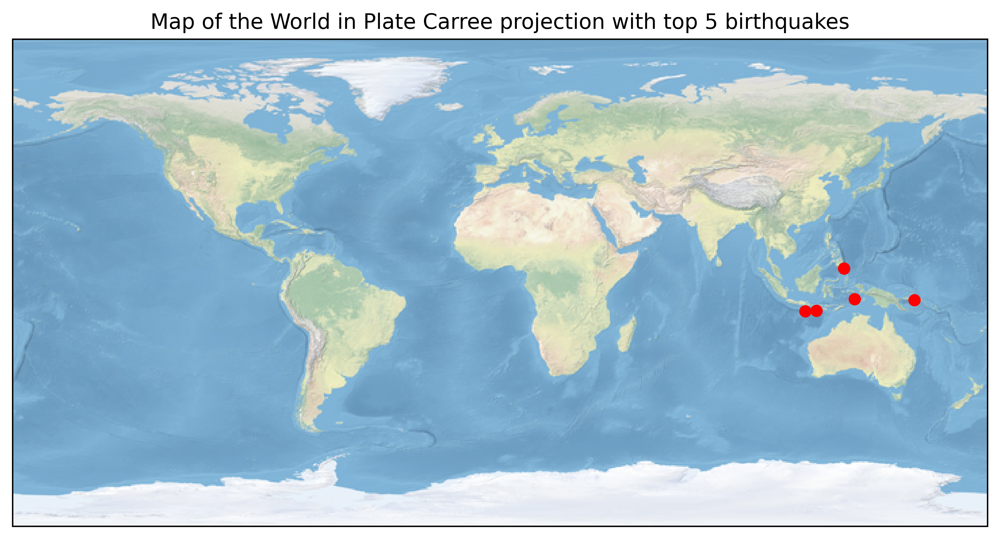

In [12]:
#3 Choose a map projection, plot the eq_longitudes and latitudes, title the figure, and save the output to some file name
plt.figure(figsize=(10,5))
ax = plt.axes(projection=ccrs.PlateCarree(central_longitude=0))                       #<< Choose a map projection
ax.stock_img()

plt.scatter(eq_longitudes, eq_latitudes, color='red')# transform=ccrs.PlateCarree(), color='red')             #<< Plot your earthquake longitudes
ax.set_title('Map of the World in Plate Carree projection with top 5 birthquakes')     #<< Gives the map a title
plt.savefig('my_birthquakes.png')                                                         #<< Give a name to save your map as


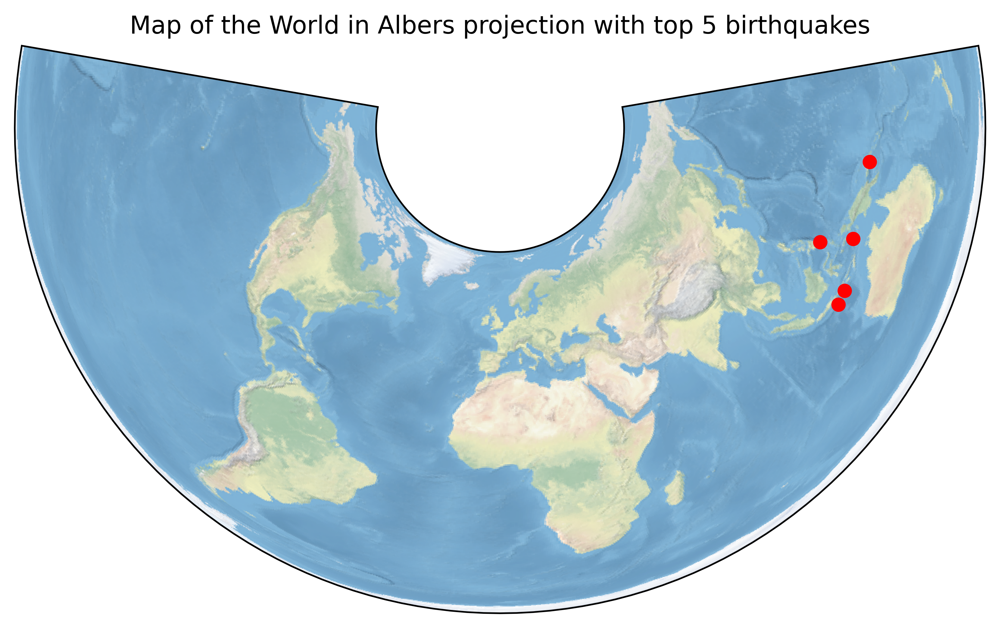

In [13]:
#3 Choose a map projection, plot the eq_longitudes and latitudes, title the figure, and save the output to some file name
plt.figure(figsize=(10,5))
ax = plt.axes(projection=ccrs.AlbersEqualArea(central_longitude=0))                       #<< Choose a map projection
ax.stock_img()

plt.scatter(eq_longitudes, eq_latitudes, transform=ccrs.PlateCarree(), color='red')             #<< Plot your earthquake longitudes
ax.set_title('Map of the World in Albers projection with top 5 birthquakes')     #<< Gives the map a title
plt.savefig('my_birthquakes_albers.png')                                                         #<< Give a name to save your map as


You're aiming for something like the image below
![alt text](Top5_birthquakes.png "Title")

### Turn in this notebook

If you want this graded then save your completed notebook, print the file to PDF, and upload the PDF on Blackboard.